In [32]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D
from keras.models import Model
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from skimage.metrics import peak_signal_noise_ratio as psnr

print("Import terminé.")

Import terminé.


In [33]:
data_dir = 'Dataset noisy'
image_files = os.listdir(data_dir)

# Paramètres des images
img_height, img_width, rgb = 180, 180, 3
input_img = Input(shape=(img_height, img_width, rgb))
images = []

for img_file in image_files:
    img_path = os.path.join(data_dir, img_file)
    img = image.load_img(img_path, target_size=(180, 180))
    img_array = image.img_to_array(img)
    images.append(img_array)

images = np.array(images)

print("Chargement terminé.")

Chargement terminé.


In [34]:
# Afficher quelques informations de base sur les données
print(f"Nombre total d'images : {images.shape[0]}")
print(f"Dimensions des images : {images.shape[1:]}")
print(f"Valeur min des pixels : {np.min(images)}")
print(f"Valeur max des pixels : {np.max(images)}")

Nombre total d'images : 148
Dimensions des images : (180, 180, 3)
Valeur min des pixels : 0.0
Valeur max des pixels : 255.0


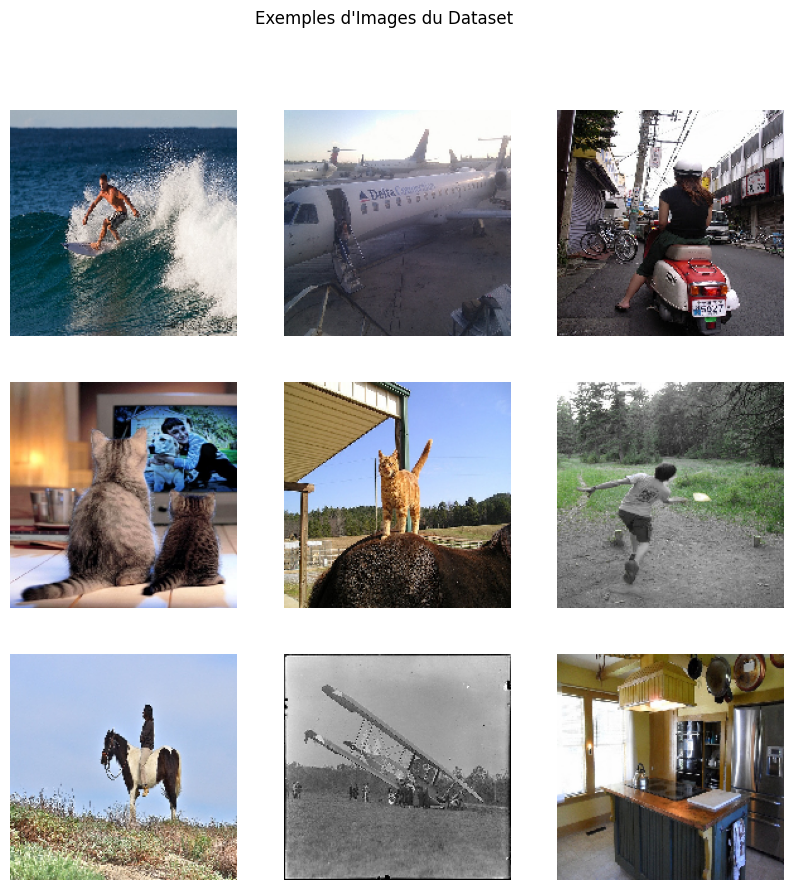

In [35]:
# Afficher quelques images
plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i+1)
    plt.imshow(images[i].astype('uint8'))
    plt.axis('off')
plt.suptitle('Exemples d\'Images du Dataset')
plt.show()

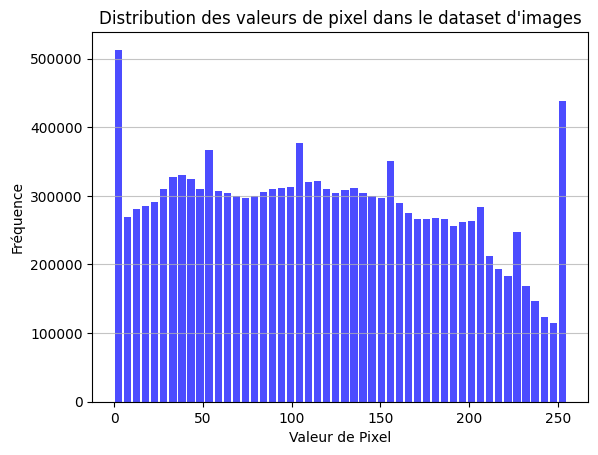

La valeur moyenne des pixels est: 117.62
L'écart-type des valeurs de pixel est: 71.52


In [36]:
# Calculer la distribution des valeurs de pixel
pixel_values = images.flatten()
plt.hist(pixel_values, bins=50, color='blue', alpha=0.7, rwidth=0.8)
plt.title('Distribution des valeurs de pixel dans le dataset d\'images')
plt.xlabel('Valeur de Pixel')
plt.ylabel('Fréquence')
plt.grid(axis='y', alpha=0.75)
plt.show()

# Calculer et afficher la moyenne et l'écart-type des valeurs de pixel
mean_pixel_value = np.mean(pixel_values)
std_pixel_value = np.std(pixel_values)
print(f"La valeur moyenne des pixels est: {mean_pixel_value:.2f}")
print(f"L'écart-type des valeurs de pixel est: {std_pixel_value:.2f}")

In [37]:
# Normaliser les images pour que les valeurs de pixel soient dans [0, 1]
normalized_images = images / 255.0

print("Normalisation terminé.")

Normalisation terminé.


In [38]:
# Paramètres pour l'ajout de bruit
noise_factor_015 = 0.15
noise_factor_040 = 0.40

# Ajout d'un bruit gaussien léger aux images
noisy_images_015 = normalized_images + noise_factor_015 * np.random.normal(loc=0.0, scale=1.0, size=normalized_images.shape)
noisy_images_015 = np.clip(noisy_images_015, 0., 1.)

# Ajout d'un bruit gaussien fort aux images
noisy_images_040 = normalized_images + noise_factor_040 * np.random.normal(loc=0.0, scale=1.0, size=normalized_images.shape)
noisy_images_040 = np.clip(noisy_images_040, 0., 1.)

print("Bruitage terminé.")

Bruitage terminé.


In [39]:
# Diviser les données en ensembles d'entraînement et de test
X_train_015, X_test_015, y_train_015, y_test_015 = train_test_split(
    noisy_images_015,   # Entrée (images bruitées)
    normalized_images,  # Cibles (images originales)
    test_size=0.2,
    random_state=42
)

# Diviser les données en ensembles d'entraînement et de test
X_train_040, X_test_040, y_train_040, y_test_040 = train_test_split(
    noisy_images_040,   # Entrée (images bruitées)
    normalized_images,  # Cibles (images originales)
    test_size=0.2,
    random_state=42
)

print("Jeux de données constitués")

Jeux de données constitués


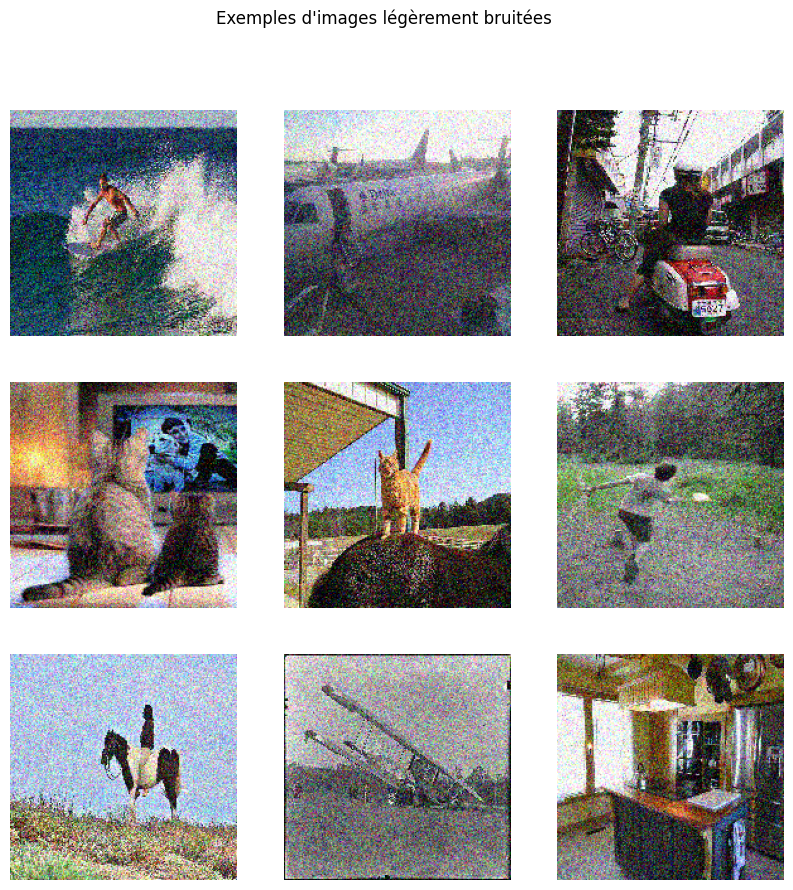

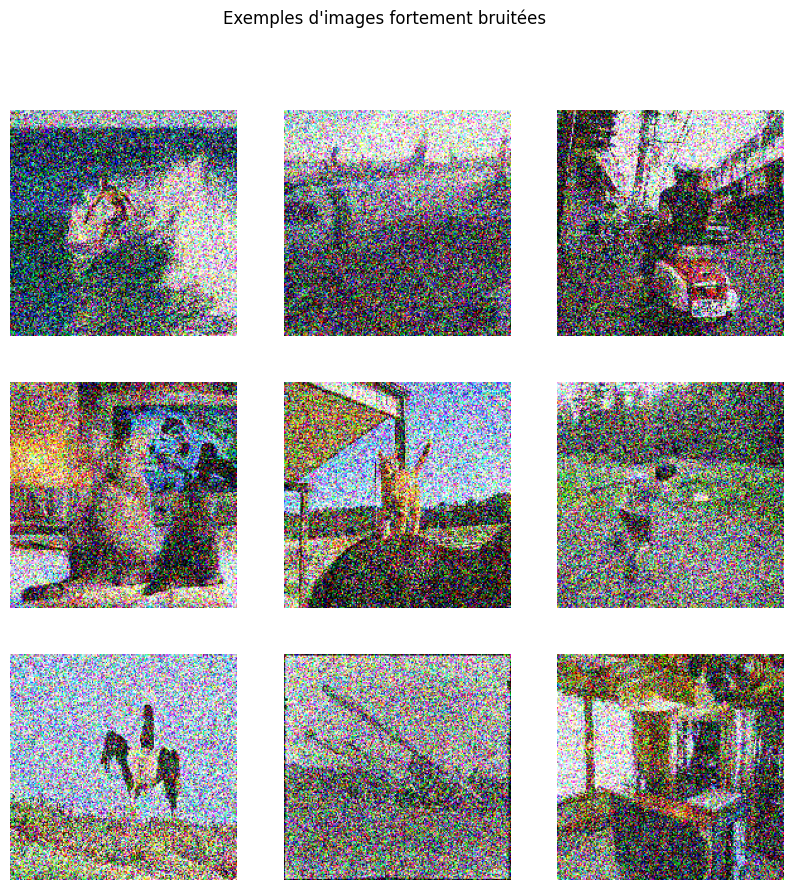

In [40]:
# Afficher quelques images légèrement bruitées
plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i+1)
    plt.imshow(noisy_images_015[i].astype('float32'))
    plt.axis('off')
plt.suptitle('Exemples d\'images légèrement bruitées')
plt.show()

# Afficher quelques images fortement bruitées
plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i+1)
    plt.imshow(noisy_images_040[i].astype('float32'))
    plt.axis('off')
plt.suptitle('Exemples d\'images fortement bruitées')
plt.show()

In [41]:
# Définition des images
input_img = Input(shape=(img_height, img_width, rgb))

print("Paramètres appliqués.")

Paramètres appliqués.


In [42]:
# Paramètres de l'encodeur
encoder_params = [
    {"filters": 64, "kernel_size": (3, 3), "activation": 'relu', "padding": 'same'},
    {"pool_size": (2, 2), "padding": 'same'},
    {"filters": 128, "kernel_size": (3, 3), "activation": 'relu', "padding": 'same'},
    {"pool_size": (2, 2), "padding": 'same'}
]

# Encodeur
x = input_img
for i in range(0, len(encoder_params), 2):
    x = Conv2D(**encoder_params[i])(x)
    x = MaxPooling2D(**encoder_params[i+1])(x)
encoded = x

print("Encodeur paramétré.")

Encodeur paramétré.


In [43]:
# Paramètres du décodeur
decoder_params = [
    {"filters": 128, "kernel_size": (3, 3), "activation": 'relu', "padding": 'same'},
    {"size": (2, 2)},
    {"filters": 64, "kernel_size": (3, 3), "activation": 'relu', "padding": 'same'},
    {"size": (2, 2)},
    {"filters": rgb, "kernel_size": (3, 3), "activation": 'sigmoid', "padding": 'same'}
]

# Décodeur
for i in range(0, len(decoder_params)-1, 2):
    x = Conv2D(**decoder_params[i])(x)
    x = UpSampling2D(**decoder_params[i+1])(x)
x = Conv2D(**decoder_params[-1])(x)
decoded = x

print("Décodeur paramétré.")

Décodeur paramétré.


In [44]:
# Construction du modèle d'auto-encodeur complet
autoencoder = Model(input_img, decoded)
autoencoder.summary()

# Augmentation des données
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    vertical_flip=True
)

autoencoder.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

autoencoder.save("autoencoder_model.h5")

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 180, 180, 3)]     0         
                                                                 
 conv2d_10 (Conv2D)          (None, 180, 180, 64)      1792      
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 90, 90, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_11 (Conv2D)          (None, 90, 90, 128)       73856     
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 45, 45, 128)       0         
 g2D)                                                            
                                                                 
 conv2d_12 (Conv2D)          (None, 45, 45, 128)       1475

In [45]:
# Paramètres globaux
epochs = 150
batch_size = 4

# Early Stopping
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    verbose=1,
    patience=10,
    restore_best_weights=True)

print("Hyperparamètres définis.")

Hyperparamètres définis.


In [46]:
history_015 = autoencoder.fit(
    X_train_015,  # images bruitées
    y_train_015,  # images originales
    epochs=epochs,
    batch_size=batch_size,
    shuffle=True,
    validation_data=(X_test_015, y_test_015),
    callbacks=[early_stopping],
)

print("Auto-encodeur 015 entraîné.")

Epoch 1/150
30/30 [==============================] - 6s 171ms/step - loss: 0.6159 - accuracy: 0.4225 - val_loss: 0.5894 - val_accuracy: 0.3590
Epoch 2/150
30/30 [==============================] - 5s 160ms/step - loss: 0.5591 - accuracy: 0.5656 - val_loss: 0.5562 - val_accuracy: 0.6510
Epoch 3/150
30/30 [==============================] - 5s 168ms/step - loss: 0.5441 - accuracy: 0.6635 - val_loss: 0.5579 - val_accuracy: 0.6565
Epoch 4/150
30/30 [==============================] - 5s 160ms/step - loss: 0.5421 - accuracy: 0.6381 - val_loss: 0.5501 - val_accuracy: 0.6380
Epoch 5/150
30/30 [==============================] - 5s 153ms/step - loss: 0.5407 - accuracy: 0.6507 - val_loss: 0.5473 - val_accuracy: 0.7003
Epoch 6/150
30/30 [==============================] - 5s 162ms/step - loss: 0.5373 - accuracy: 0.6792 - val_loss: 0.5468 - val_accuracy: 0.6826
Epoch 7/150
30/30 [==============================] - 5s 162ms/step - loss: 0.5364 - accuracy: 0.6679 - val_loss: 0.5444 - val_accuracy: 0.6924

In [47]:
history_040 = autoencoder.fit(
    X_train_040,  # images bruitées
    y_train_040,  # images originales
    epochs=epochs,
    batch_size=batch_size,
    shuffle=True,
    validation_data=(X_test_040, y_test_040),
    callbacks=[early_stopping],
)

print("Auto-encodeur 040 entraîné.")

Epoch 1/150
30/30 [==============================] - 6s 190ms/step - loss: 0.5445 - accuracy: 0.6544 - val_loss: 0.5438 - val_accuracy: 0.6551
Epoch 2/150
30/30 [==============================] - 6s 189ms/step - loss: 0.5338 - accuracy: 0.6434 - val_loss: 0.5393 - val_accuracy: 0.6679
Epoch 3/150
30/30 [==============================] - 6s 186ms/step - loss: 0.5329 - accuracy: 0.6954 - val_loss: 0.5388 - val_accuracy: 0.6990
Epoch 4/150
30/30 [==============================] - 6s 190ms/step - loss: 0.5320 - accuracy: 0.7007 - val_loss: 0.5366 - val_accuracy: 0.7104
Epoch 5/150
30/30 [==============================] - 6s 192ms/step - loss: 0.5307 - accuracy: 0.7102 - val_loss: 0.5362 - val_accuracy: 0.7208
Epoch 6/150
30/30 [==============================] - 6s 195ms/step - loss: 0.5305 - accuracy: 0.7016 - val_loss: 0.5361 - val_accuracy: 0.7352
Epoch 7/150
30/30 [==============================] - 6s 190ms/step - loss: 0.5305 - accuracy: 0.7060 - val_loss: 0.5376 - val_accuracy: 0.6966

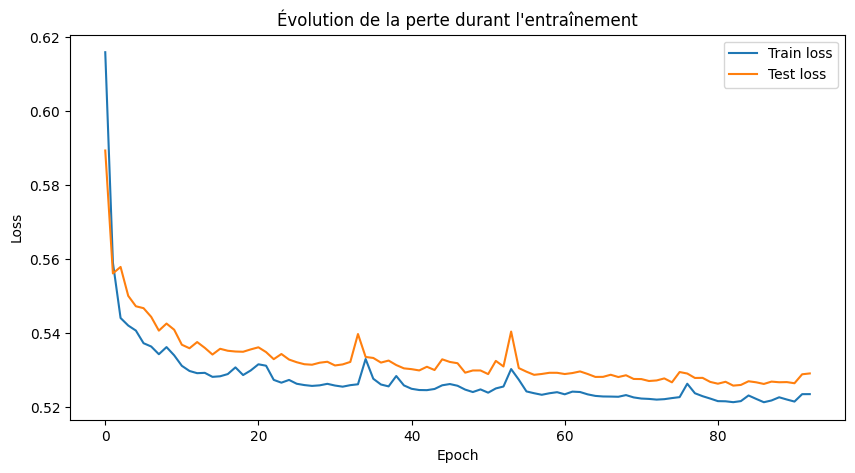

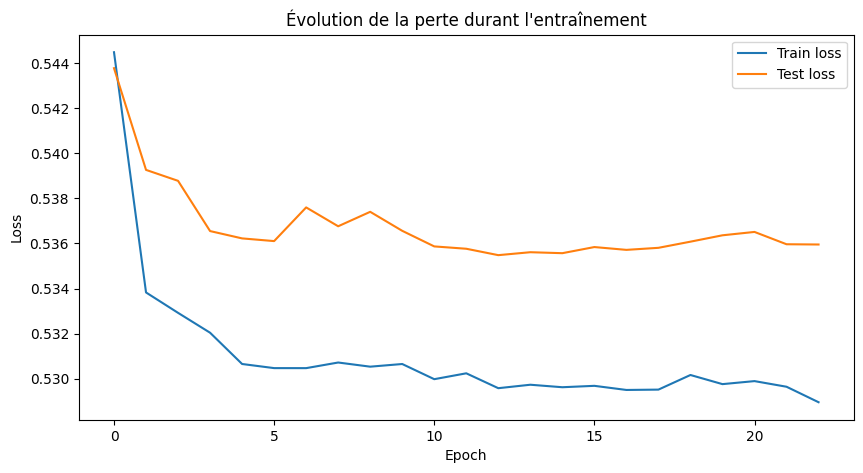

In [48]:
# Tracer l'historique de la perte durant l'entraînement (images légèrement bruitées)
plt.figure(figsize=(10, 5))
plt.plot(history_015.history['loss'], label='Train loss')
plt.plot(history_015.history['val_loss'], label='Test loss')
plt.title('Évolution de la perte durant l\'entraînement')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Tracer l'historique de la perte durant l'entraînement (images fortement bruitées)
plt.figure(figsize=(10, 5))
plt.plot(history_040.history['loss'], label='Train loss')
plt.plot(history_040.history['val_loss'], label='Test loss')
plt.title('Évolution de la perte durant l\'entraînement')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

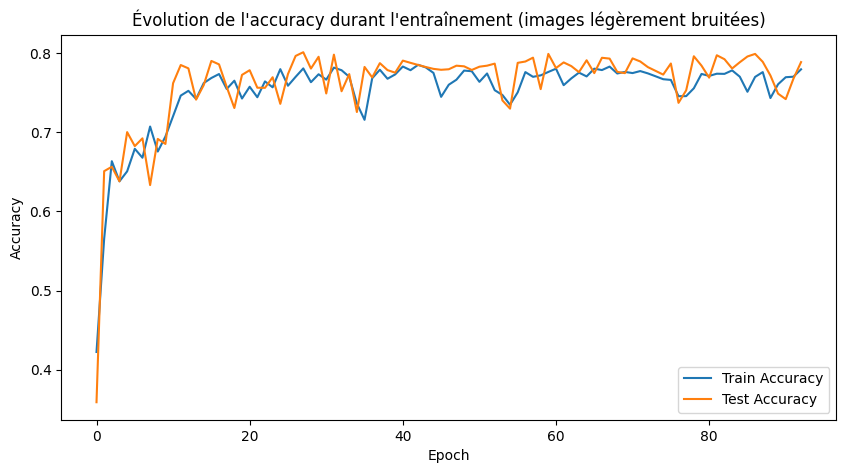

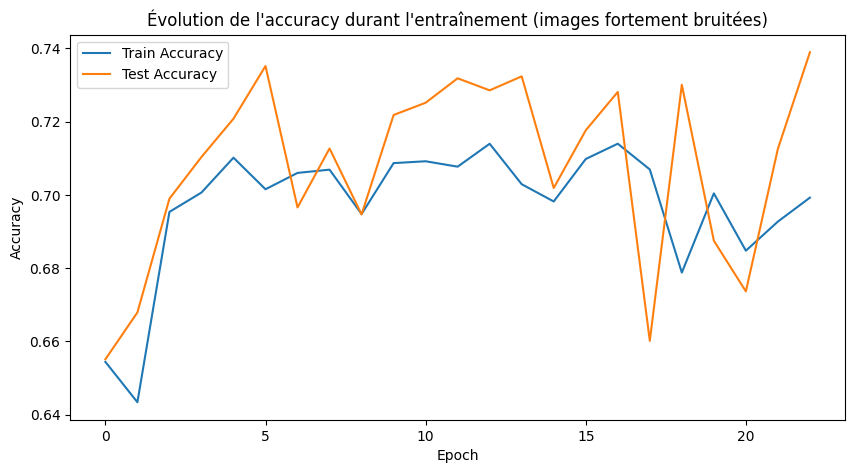

In [49]:
# Tracer l'historique de l'accuracy durant l'entraînement (images légèrement bruitées)
plt.figure(figsize=(10, 5))
plt.plot(history_015.history['accuracy'], label='Train Accuracy')
plt.plot(history_015.history['val_accuracy'], label='Test Accuracy')
plt.title('Évolution de l\'accuracy durant l\'entraînement (images légèrement bruitées)')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Tracer l'historique de l'accuracy durant l'entraînement (images fortement bruitées)
plt.figure(figsize=(10, 5))
plt.plot(history_040.history['accuracy'], label='Train Accuracy')
plt.plot(history_040.history['val_accuracy'], label='Test Accuracy')
plt.title('Évolution de l\'accuracy durant l\'entraînement (images fortement bruitées)')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [50]:
# Prédiction des images débruitées à partir des images bruitées de test
decoded_imgs_015 = autoencoder.predict(X_test_015)
decoded_imgs_040 = autoencoder.predict(X_test_040)

# Initialisation des métriques
psnr_vals = []

# Calcul du PNSR pour les images ayant été légèrement bruitées
for orig, pred in zip(y_test_015, decoded_imgs_015):
    orig = orig.astype("float32")
    pred = pred.astype("float32")
    
    # Calcul et stockage du PSNR pour chaque paire d'images
    psnr_vals.append(psnr(orig, pred, data_range=orig.max() - orig.min()))

# Calcul de la moyenne du PSNR
mean_psnr = np.mean(psnr_vals)
print(f"Mean PSNR (0.15): {mean_psnr:.2f}")

# Réinitialisation des métriques
psnr_vals = []

# Calcul du PNSR pour les images ayant été fortement bruitées
for orig, pred in zip(y_test_040, decoded_imgs_040):
    orig = orig.astype("float32")
    pred = pred.astype("float32")
    
    # Calcul et stockage du PSNR pour chaque paire d'images
    psnr_vals.append(psnr(orig, pred, data_range=orig.max() - orig.min()))

# Calcul de la moyenne du PSNR
mean_psnr = np.mean(psnr_vals)
print(f"Mean PSNR (0.40): {mean_psnr:.2f}")

1/1 [==============================] - 0s 358ms/step
Mean PSNR (0.15): 15.58
Mean PSNR (0.40): 20.04


In [51]:
# Calcul du MSE pour les images légèrement bruitées
mse_vals_015 = [mean_squared_error(orig.flatten(), pred.flatten()) for orig, pred in zip(y_test_015, decoded_imgs_015)]
mean_mse_015 = np.mean(mse_vals_015)
print(f"Mean MSE (0.15): {mean_mse_015:.3f}")

# Calcul du MSE pour les images fortement bruitées
mse_vals_040 = [mean_squared_error(orig.flatten(), pred.flatten()) for orig, pred in zip(y_test_040, decoded_imgs_040)]
mean_mse_040 = np.mean(mse_vals_040)
print(f"Mean MSE (0.40): {mean_mse_040:.3f}")

Mean MSE (0.15): 0.029
Mean MSE (0.40): 0.011


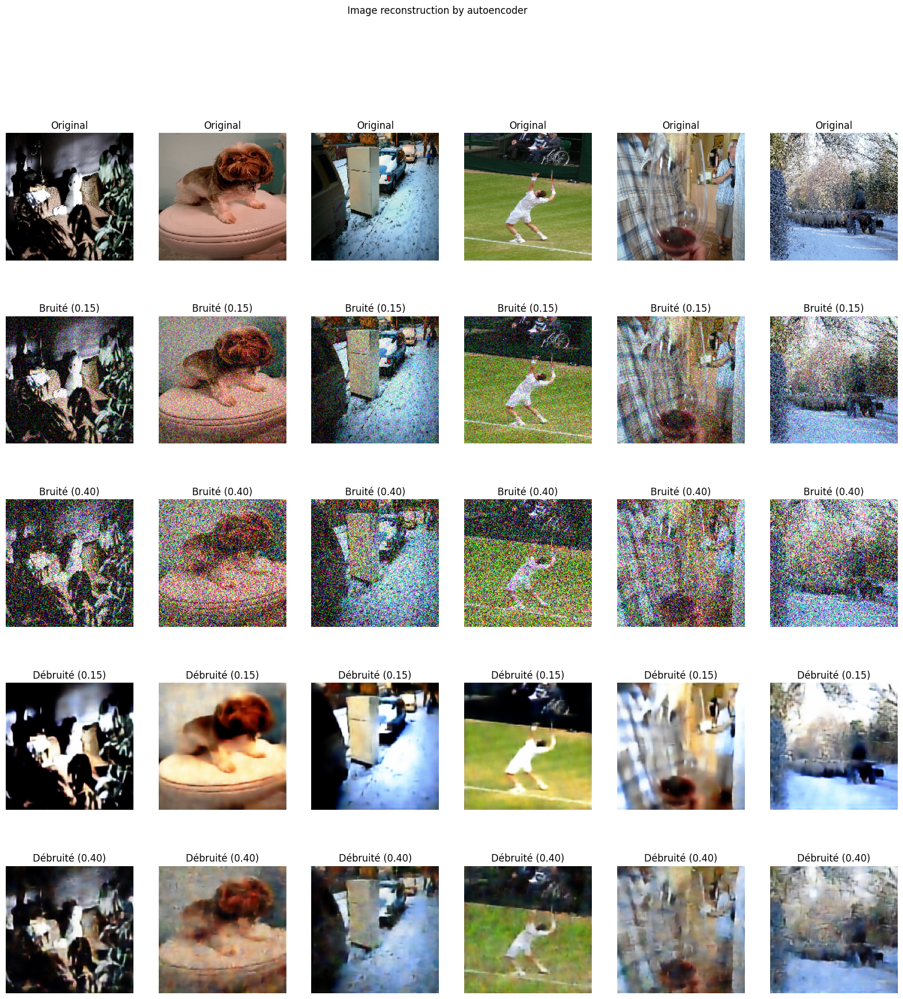

In [52]:
# Affichage des images originales, bruitées et débruitées
plt.figure(figsize=(20,20))
num_images_to_show = 6

for i in range(num_images_to_show):
    # Images originales
    ax = plt.subplot(5, num_images_to_show, i + 1)
    plt.imshow(y_test_015[i].reshape(img_height, img_width, rgb))
    plt.title("Original")
    plt.axis("off")
    
    # Images légèrement bruitées
    ax = plt.subplot(5, num_images_to_show, i + 1 + num_images_to_show)
    plt.imshow(X_test_015[i].reshape(img_height, img_width, rgb))
    plt.title("Bruité (0.15)")
    plt.axis("off")

    # Images fortement bruitées
    ax = plt.subplot(5, num_images_to_show, i + 1 + 2*num_images_to_show)
    plt.imshow(X_test_040[i].reshape(img_height, img_width, rgb))
    plt.title("Bruité (0.40)")
    plt.axis("off")
    
    # Images légèrement bruitées débruitées
    ax = plt.subplot(5, num_images_to_show, i + 1 + 3*num_images_to_show)
    plt.imshow(decoded_imgs_015[i].reshape(img_height, img_width, rgb))
    plt.title("Débruité (0.15)")
    plt.axis("off")

    # Images fortement bruitées débruitées
    ax = plt.subplot(5, num_images_to_show, i + 1 + 4*num_images_to_show)
    plt.imshow(decoded_imgs_040[i].reshape(img_height, img_width, rgb))
    plt.title("Débruité (0.40)")
    plt.axis("off")

plt.suptitle("Image reconstruction by autoencoder")
plt.show()